# Has Gold been a Good Investment Over Stock Market?

An Exploratory Data Analysis project to compare Gold vs S-P 500 index

![](https://images.pexels.com/photos/6770774/pexels-photo-6770774.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1) 

Image source : https://www.pexels.com/photo/coins-on-top-of-a-laptop-6770774/


## Introduction 

In this article we are going to analyze historical prices of Gold and S&P 500 index are try to find some useful insides using Exploratory Data Analysis (EDA).

*Disclaimer: The purpose of this article is only to demonstrate the EDA techniques with comparative analysis of Gold & S&P 500, This is not the investment advice.*


### What is EDA?

Exploratory Data Analysis (EDA) is the process of exploring, investigating and gathering insights from data using statistical measures and visualizations. The objective of EDA is to develop and understanding of data, by uncovering trends, relationships and patterns.

EDA is both a science and an art. On the one hand it requires the knowledge of statistics, visualization techniques and data analysis tools like Numpy, Pandas, Seaborn etc. On the other hand, it requires asking interesting questions to guide the investigation and interpreting numbers & figures to generate useful insights.

 
### What is the S&P 500?

The [S&P 500](https://money.usnews.com/investing/term/sp500) is a market-capitalization-weighted stock market index that tracks the stock performance of about 500 of some of the largest U.S. public companies.

Investors and economists use the S&P 500 as a benchmark for the overall U.S. stock market and the U.S. economy as a whole. The S&P 500 is a key economic indicator because it largely reflects investors' collective expectations for the future, unlike other economic data that reflect economic conditions in the present or recent past. When investors or economists discuss the performance of the U.S. "stock market," they commonly refer to the S&P 500 as a shorthand. Thats the reason I am using 'S&P 500' to represent US stock market and we will do comparative analysis against Gold. 

### How to run the code
You can execute the code using **"Google Colab"** or **"Run Locally"** 

The code is available on Github: https://github.com/vinodvidhole/gold_vs_sp500_eda_project

**Setup and Tools**

<u>Run on Colab :</u> 
    You will need to provide the Google login to run this notebook on Colab.<br>
<u>Run Locally :</u> Download and install [Anaconda](https://www.anaconda.com/) framework, We will be using Jupyter Notebook for writing & executing code.


### Installing & Importing required Libraries 

Fist step is to to install & Import required Python Libraries 

In [1]:
!pip install numpy pandas matplotlib seaborn plotly --quiet
!pip install yahoofinancials --quiet

In [96]:
from datetime import datetime, timedelta
import numpy as np 
import pandas as pd
from yahoofinancials import YahooFinancials

## Downloading the Dataset

We are going to use historical data available in [Yahoo! Finance](https://finance.yahoo.com/). Following 2 url's will point us to the required dataset.

**GOLD :** https://finance.yahoo.com/quote/GC%3DF/history?period1=967593600&period2=1660003200&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true

**S&P 500 :** https://finance.yahoo.com/quote/%5EGSPC/history?period1=-1325635200&period2=1660003200&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true

You can use web scraping techniques shown [here](https://blog.jovian.ai/web-scraping-yahoo-finance-using-python-7c4612fab70c) to download this data. But in this tutorial we are using Pyhom module [yahoofinancials](https://pypi.org/project/yahoofinancials/) to get data into the pandas dataframe. 

Let's create a helper function to download data into Pandas Data Frame

In [97]:
def get_yahoofin_dataframe(ticker, start_date, end_date, frequency):
    '''This function will return Historical pricing data in the form of Pandas DataFrame'''
    yahoo_financials = YahooFinancials(ticker)
    stock_prices = yahoo_financials.get_historical_price_data(start_date, end_date, frequency)
    return pd.DataFrame(stock_prices[ticker]['prices'])

In [98]:
#Variable initialization
start_date = '2000-08-31'
end_date = datetime.now().strftime('%Y-%m-%d')
gold_ticker = 'GC=F'
sp500_ticker = '^GSPC'
print('Start Date    :{} \nEnd Date      :{}\nGold Ticker   :{}\nS&P 500 Ticker:{}'.format(start_date, end_date,gold_ticker, sp500_ticker))

Start Date    :2000-08-31 
End Date      :2022-08-15
Gold Ticker   :GC=F
S&P 500 Ticker:^GSPC


Let's begin by downloading the data, we will call the helper function for Gold & S&P 500

In [99]:
gold_df = get_yahoofin_dataframe(gold_ticker, start_date, end_date, 'daily')
gold_df.head()

,date,high,low,open,close,volume,adjclose,formatted_date
0,967694400,278.299988,274.799988,274.799988,278.299988,0.0,278.299988,2000-08-31
1,967780800,277.000000,277.000000,277.000000,277.000000,0.0,277.000000,2000-09-01
2,968040000,NaN,NaN,NaN,NaN,NaN,NaN,2000-09-04
3,968126400,275.799988,275.799988,275.799988,275.799988,2.0,275.799988,2000-09-05
4,968212800,274.200012,274.200012,274.200012,274.200012,0.0,274.200012,2000-09-06


In [100]:
sp500_df = get_yahoofin_dataframe(sp500_ticker, start_date, end_date, 'daily')
sp500_df.head()

,date,high,low,open,close,volume,adjclose,formatted_date
0,967728600,1525.209961,1502.589966,1502.589966,1517.680054,1056600000,1517.680054,2000-08-31
1,967815000,1530.089966,1515.530029,1517.680054,1520.770020,767700000,1520.770020,2000-09-01
2,968160600,1520.770020,1504.209961,1520.770020,1507.079956,838500000,1507.079956,2000-09-05
3,968247000,1512.609985,1492.119995,1507.079956,1492.250000,995100000,1492.250000,2000-09-06
4,968333400,1505.339966,1492.250000,1492.250000,1502.510010,985500000,1502.510010,2000-09-07


In [101]:
print(gold_df.shape)
print(sp500_df.shape)

(5591, 8)
(5522, 8)


The dataset has been downloaded into Pandas DataFrame `sp500_df` & `gold_df`, Both the dataset has 8 columns and around 5.5 K rows each so total 11 K rows.  

## Data Preprocessing and Cleaning

This is one of the most Important stage in the Data Science, real world data could be `Incomplete`, `Noisy` or `Inconsistent` and this could affect negatively in the further steps. 

### Remove unwanted Columns 

Most of the time Data set may contain the columns which may not be useful for the Analysis, in that case we should remove the unused columns. This would save the memory usage this would be handy when we deal with huge dataset of the size on GBs. 

We can get rid of `date` column from our dataset as we already have `formatted_date`

In [102]:
gold_df.drop('date',axis=1, inplace=True)
sp500_df.drop('date',axis=1, inplace=True)

### Transform the DataType

By default, Pandas uses large data types like int64 and float64 for numerical data and `object` for datetime. Depending on the situation we can use the smaller data types like int32, float32, int16 to save the memory. Also we should pars the date field to date time data type.

Lets check if there is any scope of data type modifications.

In [103]:
gold_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5591 entries, 0 to 5590
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   high            5507 non-null   float64
 1   low             5507 non-null   float64
 2   open            5507 non-null   float64
 3   close           5507 non-null   float64
 4   volume          5507 non-null   float64
 5   adjclose        5507 non-null   float64
 6   formatted_date  5591 non-null   object 
dtypes: float64(6), object(1)
memory usage: 305.9+ KB


formatted_date column represent the date but the date type is `object`, Lets convert this into the DateTime.

In [104]:
sp500_df.formatted_date = pd.to_datetime(sp500_df.formatted_date)
gold_df.formatted_date = pd.to_datetime(gold_df.formatted_date)

In [105]:
print('Data Type of formatted_date : ',type(sp500_df.formatted_date[0]))

Data Type of formatted_date :  <class 'pandas._libs.tslibs.timestamps.Timestamp'>


### Handle Missing Values

There are several techniques to handle missing data, choosing the right one is of most important. The choice of technique to deal with missing data depends on the problem statement & context of the data.

Lets check if we have any missing values.

In [106]:
sp500_df.isnull().sum()

high              0
low               0
open              0
close             0
volume            0
adjclose          0
formatted_date    0
dtype: int64

S&P 500 Dataset doesn't have any missing values. 

In [107]:
gold_df.isnull().sum()

high              84
low               84
open              84
close             84
volume            84
adjclose          84
formatted_date     0
dtype: int64

It seems in the Gold Dataset 84 for items data is missing across 6 columns, Lets check if there is sequence or pattern of missing data and columns.   

In [108]:
gold_df[gold_df.high.isna()]

,high,low,open,close,volume,adjclose,formatted_date
2,NaN,NaN,NaN,NaN,NaN,NaN,2000-09-04
60,NaN,NaN,NaN,NaN,NaN,NaN,2000-11-23
61,NaN,NaN,NaN,NaN,NaN,NaN,2000-11-24
82,NaN,NaN,NaN,NaN,NaN,NaN,2000-12-25
87,NaN,NaN,NaN,NaN,NaN,NaN,2001-01-01
...,...,...,...,...,...,...,...
3952,NaN,NaN,NaN,NaN,NaN,NaN,2016-02-15
4443,NaN,NaN,NaN,NaN,NaN,NaN,2018-01-29
5536,NaN,NaN,NaN,NaN,NaN,NaN,2022-05-30
5551,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-20


Looks like there are total 84 rows in which data is missing for all columns except date.

Now to handle the missing values there are lots of techniques, but since this is daily stock price data we can use forward `fillna` method, meaning we will replace null value with next no null item from same column.

In [109]:
gold_df.fillna(method='ffill',inplace=True)
gold_df.isnull().sum()

high              0
low               0
open              0
close             0
volume            0
adjclose          0
formatted_date    0
dtype: int64

### Duplicate data 

If required, duplicate rows can be removed using the `pd.drop_duplicates` method. But this should be done carefully sometimes duplicate data mighe be a valid data (e.g. Runs Scored in any game)

In [110]:
sp500_df.duplicated().sum()
gold_df.duplicated().sum()

0

Our Dataset doesn't gave any duplicates.

### Set Proper Index 

This may or may not be applicable in all the cases, I am setting `formatted_date` as Index of the DataFrame. 

In [111]:
sp500_df.set_index('formatted_date', inplace=True)
gold_df.set_index('formatted_date', inplace=True)
sp500_df.sort_index(inplace=True)
gold_df.sort_index(inplace=True)

### Create additional Required Columns 

This may or may not be applicable in all the cases, In Our analysis for identification purpose I am creating a new column `asset_class` in both Data Frame. This would be useful when we concatenate both the Data frames.  

In [112]:
sp500_df['asset_class'] = 'S&P 500'
gold_df['asset_class'] = 'Gold'

Computing `year` , `month` etc. from `formatted_date` (Index Column) and adding it as separate column.

In [113]:
sp500_df['year'] = sp500_df.index.year
gold_df['year'] = gold_df.index.year

sp500_df['month'] = sp500_df.index.month
gold_df['month'] = gold_df.index.month

sp500_df['year_month'] = sp500_df.year.map(str) +'-'+ sp500_df.month.map(str)
gold_df['year_month'] = gold_df.year.map(str) +'-'+ gold_df.month.map(str)

This is how the final data will look like.

In [114]:
sp500_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2022-02-02,4595.310059,4544.319824,4566.390137,4589.379883,3777170000,4589.379883,S&P 500,2022,2,2022-2
2018-02-13,2668.840088,2637.080078,2646.270020,2662.939941,3472870000,2662.939941,S&P 500,2018,2,2018-2
2010-06-15,1115.589966,1091.209961,1091.209961,1115.229980,4644490000,1115.229980,S&P 500,2010,6,2010-6
2015-09-22,1961.390015,1929.219971,1961.390015,1942.739990,3808260000,1942.739990,S&P 500,2015,9,2015-9
2017-06-16,2433.149902,2422.879883,2431.239990,2433.149902,5284720000,2433.149902,S&P 500,2017,6,2017-6


In [115]:
gold_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2003-08-12,359.600006,358.100006,359.600006,358.500000,25.0,358.500000,Gold,2003,8,2003-8
2006-11-08,616.400024,616.400024,616.400024,616.400024,0.0,616.400024,Gold,2006,11,2006-11
2007-09-20,732.400024,732.400024,732.400024,732.400024,12.0,732.400024,Gold,2007,9,2007-9
2020-04-14,1775.000000,1739.500000,1756.800049,1756.699951,675.0,1756.699951,Gold,2020,4,2020-4
2011-02-22,1408.699951,1395.099976,1395.099976,1400.500000,430.0,1400.500000,Gold,2011,2,2011-2


Data Preprocessing and Cleaning is done, lets move ahead with next topic.

## Exploratory Analysis and Visualization

In this phase we will check each column and try to find some useful insides using Visualization. Let's begin by importing`matplotlib.pyplot`, `seaborn` & `plotly.express`.

In [116]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as py
%matplotlib inline

## Default settings
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Analyze Closing Price 

Here first I am combining both 'S&P 500' & 'Gold' data and then we will use line chart to study the trend of Historical closing price

In [117]:
all_df = pd.concat([sp500_df,gold_df])
all_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2019-02-20,2789.879883,2774.060059,2779.050049,2784.699951,3.835450e+09,2784.699951,S&P 500,2019,2,2019-2
2005-04-15,1162.050049,1141.920044,1162.050049,1142.619995,2.689960e+09,1142.619995,S&P 500,2005,4,2005-4
2013-02-13,1524.689941,1515.930054,1519.430054,1520.329956,3.385880e+09,1520.329956,S&P 500,2013,2,2013-2
2019-05-07,1283.500000,1280.500000,1280.500000,1283.500000,8.000000e+00,1283.500000,Gold,2019,5,2019-5
2012-01-27,1320.060059,1311.719971,1318.250000,1316.329956,4.007380e+09,1316.329956,S&P 500,2012,1,2012-1


Lets plot the graph

In [118]:
fig = px.line(all_df,
              x=all_df.index,
              y=all_df.close,
              color=all_df.asset_class, 
              color_discrete_sequence=["violet", "gold"],
              template = 'plotly_dark',
              title='Historical view of the closing price')

fig.update_layout(xaxis_title='Date', 
                  yaxis_title='Closing Price', 
                  legend_title='Asset Class')
fig.show()

By looking at `Closing Price` trend you can see that the price of `Gold` & `S&P 500` has been increased in this century. Although there are some instances where prices are declining but overall prices has been increased as compared to start of this century. It would be interesting to check the time-line and corresponding events when there is price fall, we will cover it in next section. 

### Analyze Trade Volume 

Lets check `volume` field, what it has to offered. Here I am creating one more data frame `volume_df` This will provide us the monthly sum of the `volume` for Gold & S&P 500. 

In [119]:
volume_df = all_df[['year_month','asset_class','volume']].groupby(by=['year_month','asset_class']).sum()
volume_df.reset_index(inplace=True);
volume_df.head(5)

,year_month,asset_class,volume
0,2000-10,Gold,3.210000e+02
1,2000-10,S&P 500,2.595140e+10
2,2000-11,Gold,3.246500e+04
3,2000-11,S&P 500,2.053230e+10
4,2000-12,Gold,1.677000e+03


In [120]:
fig = px.area(volume_df, 
              facet_row = 'asset_class', 
              x = 'year_month', 
              y = 'volume', 
              color = 'asset_class', 
              template = 'plotly_dark',
              color_discrete_sequence=["gold","blue"],
              labels={'asset_class':'Asset Class', }
            )

fig.update_layout(
    title="Volume Gold vs S&P 500",
    legend_title="Asset Class",
  )

fig.update_yaxes(title_text="Volume")
fig.update_xaxes(title_text="Year & Month")
fig.show()

You can clearly observe the S&P 500 is more popular than Gold, There is Literally No Comparison in terms of volume. S&P 500 is winner in this category.

Volume of S&P 500 is in Billions & Volume of Gold is in Thousands and In the above visualization x & y axis is shared hence we could not visualize the gold trend properly. 

Lets try to visualize them Individually.

In [121]:
gold_volume_df = volume_df[volume_df.asset_class == 'Gold']
sp500_volume_df = volume_df[volume_df.asset_class == 'S&P 500']

In [122]:
figure1 = px.area(sp500_volume_df, 
              x = 'year_month', 
              y = 'volume', 
              color_discrete_sequence =['blue'],
             )

figure2 = px.area(gold_volume_df, 
              x = 'year_month', 
              y = 'volume',
              color_discrete_sequence =['gold']
              )
          
fig = make_subplots(rows=2, cols=1,subplot_titles=("S&P 500","Gold")) 

fig.append_trace(figure1["data"][0], row=1, col=1)
fig.append_trace(figure2["data"][0], row=2, col=1)

fig.update_yaxes(title_text="Volume (B)", row=1, col=1)
fig.update_yaxes(title_text="Volume", row=2, col=1)


fig.update_layout(title_text="Volume Trend")       
fig.show()

It seems events like 2008 Crash & Pandemic tend to increase in the trade volume for Stock Market, but same is not true for Gold.

### Analyze the distribution

Now lets try to find what is min and max values of various columns, Pandas provide a method `df.describe()` which provides descriptive statistics that summarize the central tendency, dispersion and shape of a dataset distribution. 

In [123]:
gold_df.describe()

,high,low,open,close,volume,adjclose,year,month
count,5591.000000,5591.000000,5591.000000,5591.000000,5591.000000,5591.000000,5591.000000,5591.000000
mean,1056.535665,1045.624468,1051.236255,1051.153300,4389.184582,1051.153300,2011.065105,6.531747
std,514.156569,507.856284,511.161130,511.048767,24828.522169,511.048767,6.370526,3.437042
min,256.100006,255.000000,255.000000,255.100006,0.000000,255.100006,2000.000000,1.000000
25%,539.800018,537.600006,539.350006,539.700012,18.000000,539.700012,2006.000000,4.000000
50%,1199.199951,1188.599976,1194.599976,1194.699951,99.000000,1194.699951,2011.000000,7.000000
75%,1394.099976,1377.850037,1386.800049,1386.800049,369.500000,1386.800049,2017.000000,10.000000
max,2072.000000,2040.000000,2053.600098,2051.500000,386334.000000,2051.500000,2022.000000,12.000000


In [124]:
sp500_df.describe()

,high,low,open,close,volume,adjclose,year,month
count,5522.000000,5522.000000,5522.000000,5522.000000,5.522000e+03,5522.000000,5522.000000,5522.000000
mean,1861.923999,1839.448099,1851.155765,1851.384706,3.295069e+09,1851.384706,2011.146686,6.540927
std,952.446704,942.853761,947.871853,948.034086,1.468249e+09,948.034086,6.345159,3.429821
min,695.270020,666.789978,679.280029,676.530029,3.560700e+08,676.530029,2000.000000,1.000000
25%,1181.695038,1165.790009,1173.500000,1173.570038,2.155182e+09,1173.570038,2006.000000,4.000000
50%,1420.729980,1406.835022,1413.984985,1413.739990,3.362710e+09,1413.739990,2011.000000,7.000000
75%,2347.419983,2321.009949,2331.742615,2335.422546,4.059982e+09,2335.422546,2017.000000,10.000000
max,4818.620117,4780.040039,4804.509766,4796.560059,1.145623e+10,4796.560059,2022.000000,12.000000


But isn't it nice to Visualize it, lets see if can show this in a Plot.

In [125]:
trace0 = go.Box(
    y=sp500_df.close,
    name = 'S&P 500',
    marker = dict(
        color = 'red')
)

trace1 = go.Box(
    y=gold_df.close,
    name = 'Gold',
    marker = dict(
        color = 'navy')
)

data = [trace0, trace1]
layout = dict(title='Stock Prices of S&P 500 & Gold')

fig = dict(data=data, layout=layout)
py.iplot(fig)

Above Box plot displays Min, Max, Median & Quartiles of Closing price for S&P 500 & Gold, We can easily compare the data by placing box plots side by side.

Its interesting to notice that Average Price of Gold & S-P 500 is almost same, however Prices are fluctuating more in Stock market vs Gold. Gold Price is more stable than S&P 500 in this century.

### Calculate & Analyze Returns 

Stock daily returns indicate the gain or loss per day for a given stock. We get it by subtracting the opening price from the closing price. In Pandas there is built in function available `pct_change()` to calculate daily returns.

I have used `adjclose` column to calculate the returns.

In [126]:
gold_df['daily_return'] = gold_df.adjclose.pct_change()
sp500_df['daily_return'] = sp500_df.adjclose.pct_change()

#gold_df['log_returns'] = np.log(gold_df['adjclose']/gold_df['adjclose'].shift())
#sp500_df['log_returns'] = np.log(sp500_df['adjclose']/sp500_df['adjclose'].shift())

Lets plot the graph for the Daily Log Returns.

In [127]:
trace0 = go.Scatter(
                    x=sp500_df.index, 
                    y=sp500_df.daily_return, 
                    name='S&P 500', 
                    line=dict(color='lime'
                             )
                   )

trace1 = go.Scatter(
                    x=gold_df.index, 
                    y=gold_df.daily_return, 
                    name='Gold', 
                    line=dict(color='grey'
                             )
                   )


data = [trace0, trace1]
layout = dict(
    title='Daily Returns of S&P 500 vs Gold',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=3,
                     label='3m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=12,
                     label='1Y',
                     step='month',
                     stepmode='backward'),
                dict(count=5,
                     label='5Y',
                     step='year',
                     stepmode='backward'),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible = True
        ), type='date'
    )
)

fig = dict(data=data, layout=layout)
py.iplot(fig)

After looking at the daily returns chart we can conclude that the Stocks returns are quite volatile and it can move move more than 5% on any given day. To get a sense of distribution of the returns we can plot a histogram.

In [128]:
all_df = pd.concat([sp500_df,gold_df])
fig = px.histogram(all_df,
              x='daily_return',
              color=all_df.asset_class,
              nbins=150,
              marginal='violin',
              template = 'plotly_dark',
              title='Distribution of Daily Returns')

fig.update_layout(xaxis_title='Daily returns', 
                  yaxis_title='Freq of returns', 
                  legend_title='Asset Class')
fig.update_layout(bargap=0.1)
fig.show()

Returns for both Gold & S&P 500 are normally distributed, daily buy-sell strategy may not produce high profits.

We can also see that Gold has narrow distribution as compared to S&P 500 has a wider distribution this indicates more volatility.

Lets move on to the next section.

## Asking and Answering Interesting Questions

In this section based on the Visualization and data we will try to answer some interesting questions.

### Q1: What was impact on prices during COVID 19 Outbreak, Does gold crash with the stock market?
 
We will use classic candlestick plot to visualize this event 

In [129]:
start_covid = '2019-1-1'
end_covid  = '2021-6-30'
downfall = '2020-02-20'
trace0 = go.Candlestick(
                        x=gold_df.index,
                        open=gold_df.open,
                        high=gold_df.high, 
                        low=gold_df.low,
                        close=gold_df.close,
                        name='Gold'
                       )
trace1 = go.Candlestick(
                        x=sp500_df.index,
                        open=sp500_df.open,
                        high=sp500_df.high, 
                        low=sp500_df.low,
                        close=sp500_df.close,
                        name='S&P 500'
                       )
data = [trace0,trace1]
layout =  dict(  title = "Price Chart of Gold & S&P 500",
                 #template = 'plotly_dark',
                 xaxis = dict(range = [start_covid,end_covid]),
                 shapes = [dict(
        x0=downfall, x1=downfall, y0=0, y1=1, xref='x', yref='paper',
        line_width=2)],
      annotations=[dict(
        x=downfall, y=0.05, xref='x', yref='paper',
        showarrow=False, xanchor='left', text='Price Declining Begins')]
              )

fig = dict(data=data, layout=layout)
py.iplot(fig)

Looks like S&P 500 was crashed when COVID 19 outbreak started but after certain point prices keep on increasing on higher rate

There was no major impact on Gold prices, This shows that the gold does not crash with the stock market.

### Q2: Is there any Correlation between S&P 500 and Gold 

Lets prepare data in the required form, we will try to find correlation between daily returns of Gold & S&P 500

In [130]:
corr_df = pd.merge(sp500_df, gold_df, left_index=True, right_index=True, how='inner')[['adjclose_x','adjclose_y','daily_return_x','daily_return_y']]
corr_df.columns = ['S&P 500 Price','Gold Price','S&P 500 Returns','Gold Returns']
corr_df.sort_index(inplace=True)
corr_df.head()

,S&P 500 Price,Gold Price,S&P 500 Returns,Gold Returns
formatted_date,,,,
2000-08-31,1517.680054,278.299988,NaN,NaN
2000-09-01,1520.770020,277.000000,0.002036,-0.004671
2000-09-05,1507.079956,275.799988,-0.009002,-0.004332
2000-09-06,1492.250000,274.200012,-0.009840,-0.005801
2000-09-07,1502.510010,274.000000,0.006876,-0.000729


If we need to check the correlation between 2 columns we can use in built `.corr()` function. If there is perfect correlation then this  will return 1. 

In [131]:
corr_df["S&P 500 Returns"].corr(corr_df["S&P 500 Returns"])

1.0

In above example to show perfect correlation I used same column. Now lets try to find correlation between `S&P 500 Returns` & `Gold Returns`

In [132]:
corr_df["S&P 500 Returns"].corr(corr_df["Gold Returns"])

-0.015214102452581292

Negative value indicates no or very less correlation.

Now lets try to visualized this.

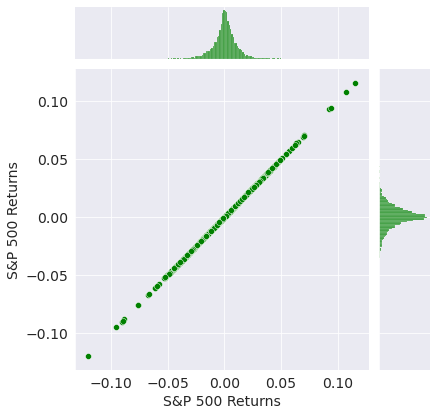

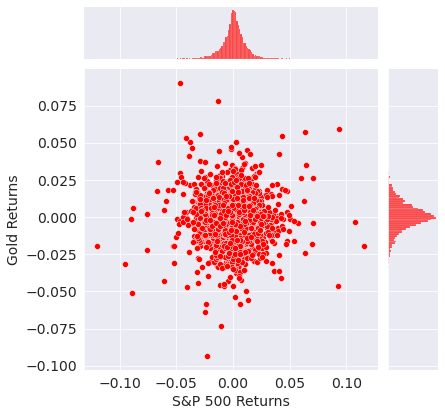

In [133]:
sns.jointplot(data=corr_df,
              x='S&P 500 Returns', 
              y='S&P 500 Returns', 
              kind='scatter',
              color='green')
sns.jointplot(data=corr_df,
              x='S&P 500 Returns', 
              y='Gold Returns', 
              kind='scatter',
              color='red');


By looking at the red graph we can say that there is no correlation between S&P 500 & Gold. And we should apply independent investment strategy for both.

### Q3: Does gold Beat S&P 500? 

We will use the cumulative returns to find this 

In [134]:
#getting rid of first row which has null ruturns 
corr_df = corr_df[1:]
corr_df.sort_index(inplace=True)

In [135]:
corr_df['sp500_cum_ret'] = ((1 + corr_df["S&P 500 Returns"]).cumprod() - 1)*100
corr_df['gold_cum_ret'] = ((1 + corr_df["Gold Returns"]).cumprod() - 1)*100

In [136]:
sp_growth = round(corr_df["sp500_cum_ret"].iloc[-1],2)
gold_growth = round(corr_df["gold_cum_ret"].iloc[-1],2)
print('S&P 500 Growth is {}% & Gold Growth is {}%'.format(sp_growth,sp_growth))

S&P 500 Growth is 181.12% & Gold Growth is 181.12%


Lets plot this in a graph

In [137]:
fig = px.line(corr_df[['sp500_cum_ret','gold_cum_ret']],
              title='Daily Cumulative Returns'
             )

fig.update_layout(yaxis_title='Daily cumulative returns (%)',
                  xaxis_title='Date',
                  legend_title='Asset Class')

fig.show()

Looks like growth of Gold is way more than S&P 500, and it would not be wrong to say that gold has Beaten S&P 500 so far in this century.

### Q4: Calculate all Year end to Date Returns 

We will calculate the returns from each year end to the current date.

In [138]:
current_gold_price = gold_df["adjclose"].iloc[-1]
current_sp500_price = sp500_df["adjclose"].iloc[-1]
print('Current Gold Price   :{}\nCurrent S&P 500 Price:{}'.format(current_gold_price,current_sp500_price))

Current Gold Price   :1798.5999755859375
Current S&P 500 Price:4280.14990234375


In [139]:
#Valid Business year end dates 
year_end_series = pd.date_range(start_date, end_date, freq='BY')

In [140]:
#Create a new data frame which contains only year end dates 
gold_ye_df = gold_df[gold_df.index.isin(year_end_series)].copy()
sp500_ye_df = sp500_df[sp500_df.index.isin(year_end_series)].copy()

In [141]:
gold_ye_df['ytd'] = (current_gold_price - gold_ye_df.adjclose)*100/gold_ye_df.adjclose
sp500_ye_df['ytd'] = (current_sp500_price - sp500_ye_df.adjclose)*100/sp500_ye_df.adjclose

In [142]:
ytd_df = pd.merge(gold_ye_df, sp500_ye_df, left_index=True, right_index=True, how='inner')[['ytd_x','ytd_y']]
ytd_df.columns = ['Gold YTD','S&P 500 YTD']

In [143]:
fig = px.bar(ytd_df,
             barmode='group',
             title='Year end to Date Returns',
             color_discrete_sequence=["goldenrod","cornflowerblue"])
                

fig.update_layout(yaxis_title='Year End to Date Returns', 
                  legend_title='Year')


Wow... this is very interesting findings. Although overall this century Gold has outperformed S&P 500, But it seems after first 6 years (2007 onwards) S&P 500 started to lead the race. In simple terms If someone invest equal amount in Gold & S&P 500 back in 2000 by 2022 his Gold portfolio would be more than S&P 500, but this would be opposite if someone invest after 2007.

2020 & 2021 seems to be bad a time for someone to start investing in both assets.

### Q5: Which asset is more Volatile

Volatility is the variation in its price over a period of time, we will calculate **Daily**, **Monthly** & **Annual** volatility.  

**Daily volatility:** The standard deviation of the daily returns. 

**Monthly volatility:** Assuming 21 trading days in the month so we multiply the daily volatility by the square root of 21.

**Annual volatility:** Similarly lets assume 252 trading days in a calendar year and we multiply the daily volatility by the square root of 252.

In [144]:
sp500_std = corr_df['S&P 500 Price'].std()
gold_std = corr_df['Gold Price'].std()
print('Daily volatility of S&P 500 : ',sp500_std)
print('Daily volatility of Gold : ',gold_std)

Daily volatility of S&P 500 :  948.2624362171587
Daily volatility of Gold :  508.71309529701904


In [145]:
print('Monthly volatility of S&P 500 :',sp500_std*np.sqrt(21))
print('Monthly volatility of Gold :',gold_std*np.sqrt(21))

Monthly volatility of S&P 500 : 4345.484392648364
Monthly volatility of Gold : 2331.2162662138735


In [146]:
print('Annual volatility of S&P 500 :',sp500_std*np.sqrt(252))
print('Annual volatility of Gold :',gold_std*np.sqrt(252))

Annual volatility of S&P 500 : 15053.199503129103
Annual volatility of Gold : 8075.5700330268855


Lets try plot Rolling Annual Volatility 

In [147]:
corr_df['sp500_volatility'] = corr_df['S&P 500 Price'].rolling(window=252).std()*np.sqrt(252)
corr_df['gold_volatility'] = corr_df['Gold Price'].rolling(window=252).std()*np.sqrt(252)

In [148]:
fig = px.line(corr_df[['sp500_volatility','gold_volatility']],
              title='Rolling Annual Volatility'
             )
                

fig.update_layout(yaxis_title='Annual Volatility', 
                  xaxis_title='Date',
                  legend_title='Asset Class')

fig.show()

Looking at the graph & calculations you can see **S&P 500** is more volatile than Gold but at some point Gold was more volatile.

### Q6: Explain Moving Average 

A "Moving Average" is an indicator which removes the "noise" from a chart by smoothing it. It makes it easier to see a pattern forming over time and helps predict future prices. This is commonly used in technical analysis.

Here I am going to show the Simple Moving Average, Below function will add moving average columns.

In [149]:
def calculate_moving_average(df,period):
    sma_col = 'Simple Moving Average {}'.format(period)
    #ema_col = 'Exponential MA {}'.format(period)
    df[sma_col] = df.adjclose.rolling(period).mean()
    #df[ema_col] = df.adjclose.ewm(span=period, adjust=False).mean()

Lets calculate 1 month & 1 Year moving average 

In [150]:
for data in [gold_df, sp500_df]:
    for period in [21,252]:
        calculate_moving_average(data,period)

Plotting Moving Average vs Closing Price.

In [151]:
fig = px.line(sp500_df[['adjclose',
                        'Simple Moving Average 21',
                        'Simple Moving Average 252'
                       ]],
              title='Simple Moving Average for S&P 500',
              #range_x=['2005-01-01','2015-12-31' ]
              )

fig.update_layout(yaxis_title='Adjusted Closing Price', 
                  xaxis_title='Date', 
                  legend_title='Moving Average', 
                 )

fig.show()

In [152]:
fig = px.line(gold_df[['adjclose',
                        'Simple Moving Average 21',
                        'Simple Moving Average 252'
                       ]],
              title='Simple Moving Average for Gold',
              #range_x=['2005-01-01','2015-12-31' ]
              )

fig.update_layout(yaxis_title='Adjusted Closing Price', 
                  xaxis_title='Date', 
                  legend_title='Moving Average', 
                 )

fig.show()

The moving average helps to level the price data over a specified period by creating a constantly updated average price.

### Q7: How to Normalize prices

If we want to compare multiple time series/stock price trends then Normalizing data would be beneficial. After normalization the price will be ranging in an interval between 0 and 1. 

Lets check how it is done.

In [153]:
def min_max_scaling(series):
    return (series - series.min()) / (series.max() - series.min())

In [154]:
gold_df['close_normalize'] = min_max_scaling(gold_df.adjclose)
sp500_df['close_normalize'] = min_max_scaling(sp500_df.adjclose)
all_df = pd.concat([sp500_df,gold_df])

In [155]:
fig = px.line(all_df,
              x=all_df.index,
              y=all_df.close_normalize,
              color=all_df.asset_class, 
              color_discrete_sequence=["violet", "gold"],
              template = 'plotly_dark',
              title='Normalized Closing Price Trend')

fig.update_layout(xaxis_title='Date', 
                  yaxis_title='Closing Price', 
                  legend_title='Asset Class')

fig.show();

Normalization is convenient for comparing price trends for multiple stocks in one graph. Normalizing time series is also good as preprocessing technique for predictions via neural networks.

### Q8: When the Gold Prices were higher than S&P 500

Mathematically its very easy to find the price differences, but if we plot the same information on the graph it became very intuitive.

Lets plot graph of closing prices long with the difference in prices.

In [169]:
#adding a new column 
corr_df['diff'] = corr_df['S&P 500 Price']-corr_df['Gold Price']

In [170]:
trace0 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['S&P 500 Price'], 
                    name='S&P 500', 
                    line=dict(color='lime')
                   )

trace1 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['Gold Price'], 
                    name='Gold', 
                    line=dict(color='grey')
                   )

trace2 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['diff'], 
                    name='Difference', 
                    line=dict(color='red')
                   )

data = [trace0, trace1, trace2]
layout = {
    'title': 'Stock Prices of S&P 500 vs Gold',
    'yaxis': {'title': 'price'},
    'shapes': [{
        'x0': '2008-12-29', 'x1': '2008-12-29',
        'y0': 0, 'y1': 1, 'yref': 'paper',
        'line': {'color': 'red', 'width': 1}
    },
    {
        'x0': '2013-04-09', 'x1': '2013-04-09',
        'y0': 0, 'y1': 1, 'yref': 'paper',
        'line': {'color': 'red', 'width': 1}
    }    
    ],
    'annotations': [{
        'x': '2008-12-29',  'yref': 'paper',
         'showarrow': False, 'xanchor': 'left',
        'text': 'Gold > S&P 500'
    },
    {
        'x': '2013-04-09',  'yref': 'paper',
         'showarrow': False, 'xanchor': 'left',
        'text': 'S&P 500 > Gold'
    }
    ]
}

fig = dict(data=data, layout=layout)
py.iplot(fig)

Its very easier to find the insights of the data via visualization, you can clearly see the Gold prices were higher from 2009 to Apr 2013.

## Inferences

From above exploratory data analysis I have drawn many inference and here's a brief summary. *(This summary is prepared based on the data captured on 08-12-2022)*

- Overall prices of Gold & S&P 500 has been increased throughout this century.


- 2008 Crash & Pandemic tend to increase in the trade volume for Stock Market, but same is not true for Gold. S&P 500 seems to be more popular than Gold


- Prices are fluctuating more in Stock market vs Gold. Gold Price is more stable than S&P 500.


- Stocks returns are quite volatile and it can move move more than 5% on any given day.


- Returns for both Gold & S&P 500 are normally distributed, daily buy-sell strategy may not produce high profits.


- S&P 500 more volatility than Gold.


- Gold does not crash with the stock market.


- There is no correlation between S&P 500 & Gold. And we should apply independent investment strategy for both.


- Gold has Beaten S&P 500 so far in this century. 


- Year 2007-2006 Gold has dominated over S-P 500 but from 2007-2019 S&P 500 Leads the race.


- Year 2020 & 2021 seems to be a bad time for someone to start investing in Gold & S&P 500.

## Future Work
Ideas for future work
* You can perform similar EDA to compare Gold, Crypto currency or any Individual stock.
* You can try to predict future prices using this EDA and applying different Machine learning models.



## References

References to some useful links.<br>

- https://github.com/vinodvidhole/gold_vs_sp500_eda_project
- https://medium.com/@vinodvidhole 
- https://money.usnews.com/investing/term/sp500
- https://finance.yahoo.com/
- https://pypi.org/project/yahoofinancials/
- https://www.quantconnect.com/tutorials/introduction-to-financial-python/rate-of-return,-mean-and-variance
- https://www.investopedia.com/terms/m/movingaverage.asp
- https://machinelearningmastery.com/normalize-standardize-time-series-data-python/

## Conclusion

I hope I was able to teach you EDA methods, and now you can use this knowledge in your future projects.

If you have any questions, feedback feel free to post a comment or contact me on [LinkedIn](https://www.linkedin.com/in/vinodvidhole/). Thank you for reading and if you liked this post, please consider following me. Until next time… Happy coding !!<br> 

**Don’t forget to give your 👏 !**
![](https://i.imgur.com/gcPLO6S.gif)

In [64]:
import jovian

In [65]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "vinodvidhole/gold-vs-sp500-eda" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/vinodvidhole/gold-vs-sp500-eda


'https://jovian.ai/vinodvidhole/gold-vs-sp500-eda'